In [2]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from shapely.geometry import Point
import folium
from decimal import Decimal, ROUND_HALF_UP

In [3]:
Data = pd.read_csv("renewable_power_plants_DE_filtered.csv")
Data = pd.DataFrame(Data)
Data

,electrical_capacity,energy_source_level_1,energy_source_level_2,energy_source_level_3,technology,data_source,nuts_1_region,nuts_2_region,nuts_3_region,lon,...,postcode,address,federal_state,commissioning_date,decommissioning_date,voltage_level,eeg_id,dso,dso_id,tso
0,0.080,Renewable energy,Bioenergy,Sewage and landfill gas,Sewage and landfill gas,TransnetBW,DE1,DE13,DE135,8.578018,...,78727.0,NaN,Baden-Württemberg,1/2/1900,NaN,medium voltage,NaN,Netze BW GmbH,10000843.0,TransnetBW
1,1.053,Renewable energy,Bioenergy,Biomass and biogas,Biomass and biogas,TransnetBW,DE2,DE27,DE27D,10.637540,...,86733.0,NaN,Bayern,6/27/1905,NaN,medium voltage,NaN,Netzgesellschaft Ostwürttemberg DonauRies GmbH,10002974.0,TransnetBW
2,0.500,Renewable energy,Bioenergy,Sewage and landfill gas,Sewage and landfill gas,TransnetBW,DE1,DE11,DE115,9.119153,...,74321.0,NaN,Baden-Württemberg,1/1/1911,NaN,medium voltage,NaN,Stadtwerke Bietigheim-Bissingen GmbH,10000386.0,TransnetBW
3,28.000,Renewable energy,Bioenergy,Biomass and biogas,Biomass and biogas,TransnetBW,DE1,DE12,DE126,8.495851,...,68305.0,NaN,Baden-Württemberg,9/1/1966,NaN,high voltage,NaN,MVV Netze GmbH,10002846.0,TransnetBW
4,19.470,Renewable energy,Bioenergy,Biomass and biogas,Biomass and biogas,Amprion,DE2,DE26,DE264,9.051289,...,63811.0,NaN,Bayern,1/1/1969,NaN,high voltage,NaN,Westnetz GmbH,10003764.0,Amprion
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14673,0.099,Renewable energy,Bioenergy,Biomass and biogas,Biomass and biogas,Amprion,DEA,DEA3,DEA35,7.182540,...,48720.0,NaN,Nordrhein-Westfalen,11/14/2019,NaN,medium voltage,NaN,Westnetz GmbH,10003764.0,Amprion
14674,0.140,Renewable energy,Bioenergy,Biomass and biogas,Biomass and biogas,TransnetBW,DE1,DE13,DE136,8.324846,...,78112.0,NaN,Baden-Württemberg,12/12/2019,NaN,medium voltage,NaN,EGT Energie GmbH,10001370.0,TransnetBW
14675,0.050,Renewable energy,Bioenergy,Biomass and biogas,Biomass and biogas,TenneT,DE2,DE22,DE22B,12.806920,...,94379.0,NaN,Brandenburg,12/15/2019,NaN,low voltage,NaN,Bayernwerk Netz GmbH,10001041.0,TenneT
14676,0.075,Renewable energy,Bioenergy,Biomass and biogas,Biomass and biogas,Amprion,DEA,DEA3,DEA34,6.847469,...,46354.0,NaN,Nordrhein-Westfalen,12/17/2019,NaN,low voltage,NaN,SVS-Versorgungsbetriebe GmbH,10001191.0,Amprion


In [4]:
Data.describe()

,electrical_capacity,lon,lat,municipality_code,postcode,decommissioning_date,dso_id
count,14678.000000,14667.000000,14667.000000,1.467800e+04,14677.000000,0.0,1.451500e+04
mean,0.546487,10.079278,50.871065,7.703260e+06,54628.922941,NaN,1.000218e+07
std,1.633474,1.948444,2.063802,3.839228e+06,29665.892441,NaN,1.930123e+03
min,0.001000,5.988064,47.465373,1.002000e+06,1067.000000,NaN,1.000006e+07
25%,0.150000,8.622760,48.855799,3.459031e+06,27248.000000,NaN,1.000104e+07
50%,0.342500,9.964411,51.055755,8.326061e+06,49688.000000,NaN,1.000164e+07
75%,0.600000,11.614443,52.657712,9.573115e+06,85467.000000,NaN,1.000301e+07
max,138.900000,14.939041,54.935455,1.607705e+07,99998.000000,NaN,1.001205e+07


In [5]:
Data.dtypes

electrical_capacity      float64
energy_source_level_1     object
energy_source_level_2     object
energy_source_level_3     object
technology                object
data_source               object
nuts_1_region             object
nuts_2_region             object
nuts_3_region             object
lon                      float64
lat                      float64
municipality              object
municipality_code          int64
postcode                 float64
address                   object
federal_state             object
commissioning_date        object
decommissioning_date     float64
voltage_level             object
eeg_id                    object
dso                       object
dso_id                   float64
tso                       object
dtype: object

In [6]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14678 entries, 0 to 14677
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   electrical_capacity    14678 non-null  float64
 1   energy_source_level_1  14678 non-null  object 
 2   energy_source_level_2  14678 non-null  object 
 3   energy_source_level_3  14678 non-null  object 
 4   technology             14678 non-null  object 
 5   data_source            14678 non-null  object 
 6   nuts_1_region          14678 non-null  object 
 7   nuts_2_region          14678 non-null  object 
 8   nuts_3_region          14678 non-null  object 
 9   lon                    14667 non-null  float64
 10  lat                    14667 non-null  float64
 11  municipality           13858 non-null  object 
 12  municipality_code      14678 non-null  int64  
 13  postcode               14677 non-null  float64
 14  address                151 non-null    object 
 15  fe

In [7]:
New_data = Data[["energy_source_level_3","lat","lon","dso","federal_state"]]
New_data.rename(columns={"energy_source_level_3":"Energy_source","lon":"longitude","lat":"latitude"}, inplace=True)
New_data["federal_state"] = New_data["federal_state"].replace("Baden-Würtemberg", "Baden-Württemberg")
New_data["federal_state"] = New_data["federal_state"].replace('Berlin ', 'Berlin')
New_data

C:\Users\49157\AppData\Local\Temp\ipykernel_11528\1245234300.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_data.rename(columns={"energy_source_level_3":"Energy_source","lon":"longitude","lat":"latitude"}, inplace=True)
C:\Users\49157\AppData\Local\Temp\ipykernel_11528\1245234300.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_data["federal_state"] = New_data["federal_state"].replace("Baden-Würtemberg", "Baden-Württemberg")
C:\Users\49157\AppData\Local\Temp\ipykernel_11528\1245234300.py:4: SettingWithCopyWarning: 
A value is trying to be set on a

,Energy_source,latitude,longitude,dso,federal_state
0,Sewage and landfill gas,48.292429,8.578018,Netze BW GmbH,Baden-Württemberg
1,Biomass and biogas,48.843981,10.637540,Netzgesellschaft Ostwürttemberg DonauRies GmbH,Bayern
2,Sewage and landfill gas,48.958223,9.119153,Stadtwerke Bietigheim-Bissingen GmbH,Baden-Württemberg
3,Biomass and biogas,49.533744,8.495851,MVV Netze GmbH,Baden-Württemberg
4,Biomass and biogas,49.972251,9.051289,Westnetz GmbH,Bayern
...,...,...,...,...,...
14673,Biomass and biogas,52.013579,7.182540,Westnetz GmbH,Nordrhein-Westfalen
14674,Biomass and biogas,48.128224,8.324846,EGT Energie GmbH,Baden-Württemberg
14675,Biomass and biogas,49.011974,12.806920,Bayernwerk Netz GmbH,Brandenburg
14676,Biomass and biogas,51.951513,6.847469,SVS-Versorgungsbetriebe GmbH,Nordrhein-Westfalen


In [8]:
New_data.dropna()

,Energy_source,latitude,longitude,dso,federal_state
0,Sewage and landfill gas,48.292429,8.578018,Netze BW GmbH,Baden-Württemberg
1,Biomass and biogas,48.843981,10.637540,Netzgesellschaft Ostwürttemberg DonauRies GmbH,Bayern
2,Sewage and landfill gas,48.958223,9.119153,Stadtwerke Bietigheim-Bissingen GmbH,Baden-Württemberg
3,Biomass and biogas,49.533744,8.495851,MVV Netze GmbH,Baden-Württemberg
4,Biomass and biogas,49.972251,9.051289,Westnetz GmbH,Bayern
...,...,...,...,...,...
14673,Biomass and biogas,52.013579,7.182540,Westnetz GmbH,Nordrhein-Westfalen
14674,Biomass and biogas,48.128224,8.324846,EGT Energie GmbH,Baden-Württemberg
14675,Biomass and biogas,49.011974,12.806920,Bayernwerk Netz GmbH,Brandenburg
14676,Biomass and biogas,51.951513,6.847469,SVS-Versorgungsbetriebe GmbH,Nordrhein-Westfalen


In [9]:
New_data['Energy_source'].unique()

array(['Sewage and landfill gas', 'Biomass and biogas'], dtype=object)

In [10]:
New_data.dropna()

,Energy_source,latitude,longitude,dso,federal_state
0,Sewage and landfill gas,48.292429,8.578018,Netze BW GmbH,Baden-Württemberg
1,Biomass and biogas,48.843981,10.637540,Netzgesellschaft Ostwürttemberg DonauRies GmbH,Bayern
2,Sewage and landfill gas,48.958223,9.119153,Stadtwerke Bietigheim-Bissingen GmbH,Baden-Württemberg
3,Biomass and biogas,49.533744,8.495851,MVV Netze GmbH,Baden-Württemberg
4,Biomass and biogas,49.972251,9.051289,Westnetz GmbH,Bayern
...,...,...,...,...,...
14673,Biomass and biogas,52.013579,7.182540,Westnetz GmbH,Nordrhein-Westfalen
14674,Biomass and biogas,48.128224,8.324846,EGT Energie GmbH,Baden-Württemberg
14675,Biomass and biogas,49.011974,12.806920,Bayernwerk Netz GmbH,Brandenburg
14676,Biomass and biogas,51.951513,6.847469,SVS-Versorgungsbetriebe GmbH,Nordrhein-Westfalen


In [11]:
Only_Sewage_and_landfill_gas = New_data[New_data["Energy_source"].str.contains('Sewage and landfill gas')]
Only_Sewage_and_landfill_gas


,Energy_source,latitude,longitude,dso,federal_state
0,Sewage and landfill gas,48.292429,8.578018,Netze BW GmbH,Baden-Württemberg
2,Sewage and landfill gas,48.958223,9.119153,Stadtwerke Bietigheim-Bissingen GmbH,Baden-Württemberg
6,Sewage and landfill gas,54.589596,9.067206,Schleswig-Holstein Netz AG,Saarland
7,Sewage and landfill gas,48.580074,8.023745,Syna GmbH,Baden-Württemberg
8,Sewage and landfill gas,48.408064,8.033654,Überlandwerk Mittelbaden GmbH & Co. KG,Baden-Württemberg
...,...,...,...,...,...
14531,Sewage and landfill gas,51.493552,7.768508,Stadtwerke Fröndenberg GmbH,Nordrhein-Westfalen
14567,Sewage and landfill gas,47.741881,9.609389,TWS Netz GmbH,Baden-Württemberg
14641,Sewage and landfill gas,48.013220,8.665719,Netze BW GmbH,Baden-Württemberg
14653,Sewage and landfill gas,48.598094,8.602903,Stadtwerke Altensteig,Baden-Württemberg


In [12]:
Only_Sewage_and_landfill_gas.dropna()

,Energy_source,latitude,longitude,dso,federal_state
0,Sewage and landfill gas,48.292429,8.578018,Netze BW GmbH,Baden-Württemberg
2,Sewage and landfill gas,48.958223,9.119153,Stadtwerke Bietigheim-Bissingen GmbH,Baden-Württemberg
6,Sewage and landfill gas,54.589596,9.067206,Schleswig-Holstein Netz AG,Saarland
7,Sewage and landfill gas,48.580074,8.023745,Syna GmbH,Baden-Württemberg
8,Sewage and landfill gas,48.408064,8.033654,Überlandwerk Mittelbaden GmbH & Co. KG,Baden-Württemberg
...,...,...,...,...,...
14531,Sewage and landfill gas,51.493552,7.768508,Stadtwerke Fröndenberg GmbH,Nordrhein-Westfalen
14567,Sewage and landfill gas,47.741881,9.609389,TWS Netz GmbH,Baden-Württemberg
14641,Sewage and landfill gas,48.013220,8.665719,Netze BW GmbH,Baden-Württemberg
14653,Sewage and landfill gas,48.598094,8.602903,Stadtwerke Altensteig,Baden-Württemberg


In [13]:
Only_Sewage_and_landfill_gas_1 = Only_Sewage_and_landfill_gas.drop_duplicates(subset=["latitude","longitude"], keep="first")
Only_Sewage_and_landfill_gas_1.dropna()

,Energy_source,latitude,longitude,dso,federal_state
0,Sewage and landfill gas,48.292429,8.578018,Netze BW GmbH,Baden-Württemberg
2,Sewage and landfill gas,48.958223,9.119153,Stadtwerke Bietigheim-Bissingen GmbH,Baden-Württemberg
6,Sewage and landfill gas,54.589596,9.067206,Schleswig-Holstein Netz AG,Saarland
7,Sewage and landfill gas,48.580074,8.023745,Syna GmbH,Baden-Württemberg
8,Sewage and landfill gas,48.408064,8.033654,Überlandwerk Mittelbaden GmbH & Co. KG,Baden-Württemberg
...,...,...,...,...,...
14513,Sewage and landfill gas,50.144759,8.062864,SYNA GmbH,Hessen
14516,Sewage and landfill gas,52.002409,8.765903,Westfalen Weser Netz GmbH,Nordrhein-Westfalen
14527,Sewage and landfill gas,50.203036,11.265627,Bayernwerk Netz GmbH,Bayern
14530,Sewage and landfill gas,51.493552,7.768508,Stadtwerke Fröndenberg GmbH,Nordrhein-Westfalen


In [14]:
Only_Biomass_and_biogas = New_data[New_data["Energy_source"].str.contains('Biomass and biogas')]
Only_Biomass_and_biogas

,Energy_source,latitude,longitude,dso,federal_state
1,Biomass and biogas,48.843981,10.637540,Netzgesellschaft Ostwürttemberg DonauRies GmbH,Bayern
3,Biomass and biogas,49.533744,8.495851,MVV Netze GmbH,Baden-Württemberg
4,Biomass and biogas,49.972251,9.051289,Westnetz GmbH,Bayern
5,Biomass and biogas,49.213169,12.658838,Stadtwerke Cham GmbH,Brandenburg
11,Biomass and biogas,47.743188,10.339842,AllgäuNetz GmbH & Co. KG,Bayern
...,...,...,...,...,...
14673,Biomass and biogas,52.013579,7.182540,Westnetz GmbH,Nordrhein-Westfalen
14674,Biomass and biogas,48.128224,8.324846,EGT Energie GmbH,Baden-Württemberg
14675,Biomass and biogas,49.011974,12.806920,Bayernwerk Netz GmbH,Brandenburg
14676,Biomass and biogas,51.951513,6.847469,SVS-Versorgungsbetriebe GmbH,Nordrhein-Westfalen


In [15]:
Only_Biomass_and_biogas.dropna()

,Energy_source,latitude,longitude,dso,federal_state
1,Biomass and biogas,48.843981,10.637540,Netzgesellschaft Ostwürttemberg DonauRies GmbH,Bayern
3,Biomass and biogas,49.533744,8.495851,MVV Netze GmbH,Baden-Württemberg
4,Biomass and biogas,49.972251,9.051289,Westnetz GmbH,Bayern
5,Biomass and biogas,49.213169,12.658838,Stadtwerke Cham GmbH,Brandenburg
11,Biomass and biogas,47.743188,10.339842,AllgäuNetz GmbH & Co. KG,Bayern
...,...,...,...,...,...
14673,Biomass and biogas,52.013579,7.182540,Westnetz GmbH,Nordrhein-Westfalen
14674,Biomass and biogas,48.128224,8.324846,EGT Energie GmbH,Baden-Württemberg
14675,Biomass and biogas,49.011974,12.806920,Bayernwerk Netz GmbH,Brandenburg
14676,Biomass and biogas,51.951513,6.847469,SVS-Versorgungsbetriebe GmbH,Nordrhein-Westfalen


In [16]:
Only_biomass = New_data[New_data["Energy_source"].str.contains('Biomass and biogas')].dropna()
Only_biomass

,Energy_source,latitude,longitude,dso,federal_state
1,Biomass and biogas,48.843981,10.637540,Netzgesellschaft Ostwürttemberg DonauRies GmbH,Bayern
3,Biomass and biogas,49.533744,8.495851,MVV Netze GmbH,Baden-Württemberg
4,Biomass and biogas,49.972251,9.051289,Westnetz GmbH,Bayern
5,Biomass and biogas,49.213169,12.658838,Stadtwerke Cham GmbH,Brandenburg
11,Biomass and biogas,47.743188,10.339842,AllgäuNetz GmbH & Co. KG,Bayern
...,...,...,...,...,...
14673,Biomass and biogas,52.013579,7.182540,Westnetz GmbH,Nordrhein-Westfalen
14674,Biomass and biogas,48.128224,8.324846,EGT Energie GmbH,Baden-Württemberg
14675,Biomass and biogas,49.011974,12.806920,Bayernwerk Netz GmbH,Brandenburg
14676,Biomass and biogas,51.951513,6.847469,SVS-Versorgungsbetriebe GmbH,Nordrhein-Westfalen


In [17]:
Only_biomass = Only_biomass.drop_duplicates(subset=["latitude","longitude"], keep="first")
Only_biomass

,Energy_source,latitude,longitude,dso,federal_state
1,Biomass and biogas,48.843981,10.637540,Netzgesellschaft Ostwürttemberg DonauRies GmbH,Bayern
3,Biomass and biogas,49.533744,8.495851,MVV Netze GmbH,Baden-Württemberg
4,Biomass and biogas,49.972251,9.051289,Westnetz GmbH,Bayern
5,Biomass and biogas,49.213169,12.658838,Stadtwerke Cham GmbH,Brandenburg
11,Biomass and biogas,47.743188,10.339842,AllgäuNetz GmbH & Co. KG,Bayern
...,...,...,...,...,...
14661,Biomass and biogas,47.792973,12.571951,Bayernwerk Netz GmbH,Brandenburg
14663,Biomass and biogas,50.178432,6.612534,Westnetz GmbH,Rheinland-Pfalz
14664,Biomass and biogas,48.135996,11.002485,LEW Verteilnetz GmbH,Bayern
14669,Biomass and biogas,53.985994,13.547447,E.DIS Netz GmbH,Mecklenburg-Vorpommern


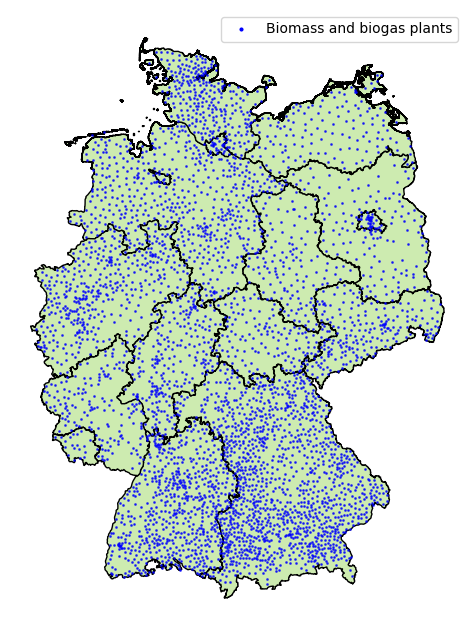

<module 'matplotlib.pyplot' from 'C:\\Users\\49157\\anaconda3\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [18]:
germany_state = gpd.read_file(r"C:\Users\49157\Germany_states.json")

biogas_plant_location = pd.DataFrame(Only_biomass[["latitude","longitude"]])


fig, ax = plt.subplots(1, 1, figsize=(12, 8))
germany_state.plot(ax=ax, color='#cdebb0', edgecolor='black')


for _, row in biogas_plant_location.iterrows():
    ax.scatter(row["longitude"], row["latitude"], color='blue', s=1, label="Biomass and biogas plants", alpha=0.7)

location = Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', 
                            markeredgewidth=2, markersize=5, label="Biomass and biogas plants")


#ax.set_title("Biomass and biogas plants in Germany (1900-2019)", fontsize=14)
ax.axis("off")

ax.legend(handles=[location], loc="upper right", fontsize=10)
"""plt.savefig(r"C:\Faounhofer Master thesis\Image Collection\bioenergy_plansts.png", dpi=1200, format='png',
          bbox_inches='tight', pad_inches=0.1,
        
         )"""
plt.show()
plt


In [19]:
map = folium.Map(location=[51.5167,9.9167], zoom_start=4)
folium.GeoJson(germany_state).add_to(map)
map
Only_biomass.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(map),
    axis=1
)
map

In [20]:
germany = pd.DataFrame({"Federal_states":["Baden-Wuerttemberg","Bayern","Brandenburg","Hessen","Mecklenburg-Vorpommern","Niedersachsen","Nordrhein-Westfalen","Rheinland-Pfalz","Saarland","Sachsen","Sachsen-Anhalt","Schleswig-Holstein","Thueringen","Berlin", "Hamburg","Bremen"],"Silage_maize(per 1,000 hactare)":[128.0,419.4,173.3,44.2,142.5,506.9,205.0,30.1,4.6,83.5,118.7,181.0,59.1,np.nan,np.nan,np.nan]})
germany

,Federal_states,"Silage_maize(per 1,000 hactare)"
0,Baden-Wuerttemberg,128.0
1,Bayern,419.4
2,Brandenburg,173.3
3,Hessen,44.2
4,Mecklenburg-Vorpommern,142.5
5,Niedersachsen,506.9
6,Nordrhein-Westfalen,205.0
7,Rheinland-Pfalz,30.1
8,Saarland,4.6
9,Sachsen,83.5


In [21]:
maize = germany.rename(columns={"Silage_maize(per 1,000 hactare)":"Silage_maize(per 10,000 tons)"})
maize["Silage_maize(per 10,000 tons)"] = maize["Silage_maize(per 10,000 tons)"]*4.438
maize

,Federal_states,"Silage_maize(per 10,000 tons)"
0,Baden-Wuerttemberg,568.0640
1,Bayern,1861.2972
2,Brandenburg,769.1054
3,Hessen,196.1596
4,Mecklenburg-Vorpommern,632.4150
5,Niedersachsen,2249.6222
6,Nordrhein-Westfalen,909.7900
7,Rheinland-Pfalz,133.5838
8,Saarland,20.4148
9,Sachsen,370.5730


In [22]:
maize_01 = maize.sort_values(by="Silage_maize(per 10,000 tons)", ascending=False)
maize_01  = maize_01.reset_index(drop=True)
print(maize_01)
maize_02 = list(maize_01["Federal_states"])
print(maize_02)
y = list(maize["Silage_maize(per 10,000 tons)"])
print(y)
maize_03 = maize["Silage_maize(per 10,000 tons)"].sum()
print(maize_03)
x = maize_03*10000
print(x)


            Federal_states  Silage_maize(per 10,000 tons)
0            Niedersachsen                      2249.6222
1                   Bayern                      1861.2972
2      Nordrhein-Westfalen                       909.7900
3       Schleswig-Holstein                       803.2780
4              Brandenburg                       769.1054
5   Mecklenburg-Vorpommern                       632.4150
6       Baden-Wuerttemberg                       568.0640
7           Sachsen-Anhalt                       526.7906
8                  Sachsen                       370.5730
9               Thueringen                       262.2858
10                  Hessen                       196.1596
11         Rheinland-Pfalz                       133.5838
12                Saarland                        20.4148
13                  Berlin                            NaN
14                 Hamburg                            NaN
15                  Bremen                            NaN
['Niedersachse

In [23]:
germany_map =  folium.Map(location=[51.5167,9.9167], zoom_start=4)
folium.Choropleth(
    geo_data=germany_state,
    data=germany,
    columns=["Federal_states", "Silage_maize(per 1,000 hactare)"],
    key_on="feature.properties.name",
    fill_color="YlGn",
    nan_fill_color = 'black',
    nan_fill_opacity=0.7,
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Silage maize/green maize harvest in 2024 (per 1,000 hactare)",
    highlight=True,
).add_to(germany_map)

germany_map

In [24]:
Only_biomass.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(germany_map),
    axis=1
)
germany_map

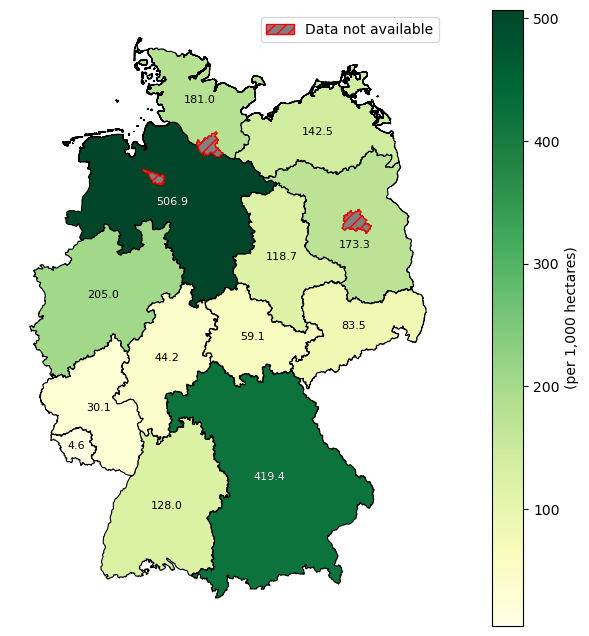

In [25]:
germany_merged = germany_state.merge(
    germany, 
    left_on="name",  
    right_on="Federal_states",
    how='left'
)

fig, ax = plt.subplots(1, 1, figsize=(12, 8), dpi=100)
germany_merged.plot(
    column="Silage_maize(per 1,000 hactare)",
    cmap="YlGn",
    linewidth=0.8,
    edgecolor="black",
    legend=True,
    legend_kwds={'label': "(per 1,000 hectares)"},
    missing_kwds={
        "color": "grey",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Data not available"},
    ax=ax
)

missing_patch = Patch(
    facecolor="grey",
    edgecolor="red",
    hatch="///",
    label="Data not available"
)

for x, row in germany_merged.iterrows():
    if not pd.isna(row["Silage_maize(per 1,000 hactare)"]):
        x, y = row['geometry'].centroid.coords[0]

        if row['name'] == "Brandenburg":
            y -= 0.3  
        ax.text(x, y, f"{row['Silage_maize(per 1,000 hactare)']:.1f}", ha='center', va='center', fontsize=8, color='black')


        if row['name'] in  ["Niedersachsen", "Bayern"]: 
         ax.text(x, y, f"{row['Silage_maize(per 1,000 hactare)']:.1f}", ha='center', va='center', fontsize=8, color='white')


ax.legend(handles=[missing_patch], loc="upper right", fontsize=10)
#ax.set_title("Silage Maize/Green Maize Harvest in Germany for year 2024", fontsize=14)
ax.axis("off")
"""plt.savefig(r"C:\Faounhofer Master thesis\Image Collection\Silage_Maize_yield.png", dpi=1200, format='png',
          bbox_inches='tight', pad_inches=0.1,
        
         )"""

plt.show()

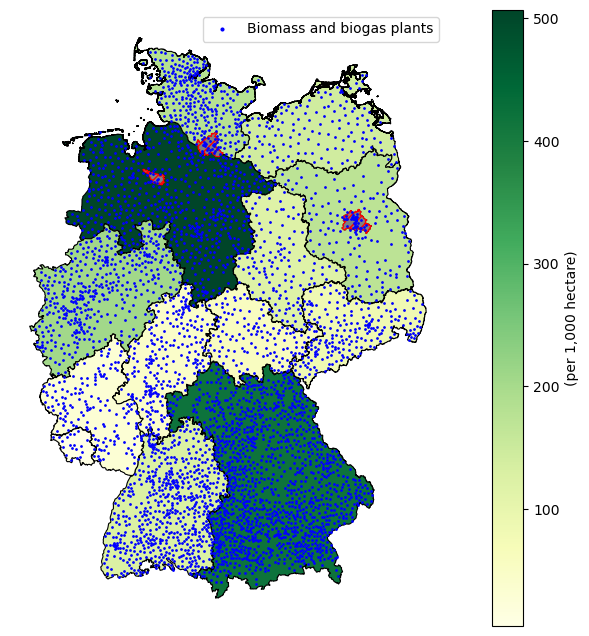

In [26]:

fig, ax = plt.subplots(1, 1, figsize=(12, 8))
germany_merged.plot(
    column="Silage_maize(per 1,000 hactare)",
    cmap="YlGn",
    linewidth=0.8,
    edgecolor="black",
    legend=True,
    legend_kwds={'label': "(per 1,000 hectare)"},
    missing_kwds={
        "color": "grey",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Data not available"},

    ax=ax)



for _, row in biogas_plant_location.iterrows():
     ax.scatter(row["longitude"], row["latitude"], color='blue', s=1, label="Biogasa and biomass plant locations")




ax.axis("off")

ax.legend(handles=[location], loc="upper right", fontsize=10)
"""plt.savefig(r"C:\Faounhofer Master thesis\Image Collection\maize_yield_with_location.png", dpi=1200, format='png',
         bbox_inches='tight', pad_inches=0.1,
        
         )"""

plt.show()

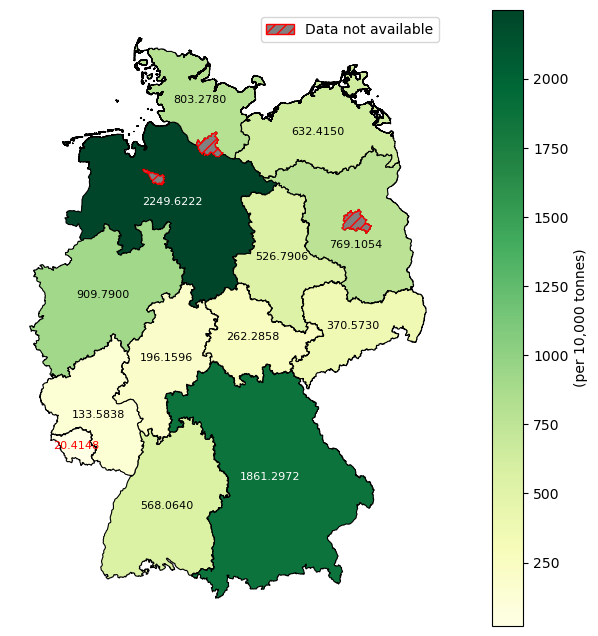

In [27]:
germany_merged = germany_state.merge(
    maize, 
    left_on="name",  
    right_on="Federal_states",
    how='left'
)

fig, ax = plt.subplots(1, 1, figsize=(12, 8), dpi=100)
germany_merged.plot(
    column="Silage_maize(per 10,000 tons)",
    cmap="YlGn",
    linewidth=0.8,
    edgecolor="black",
    legend=True,
    legend_kwds={'label': "(per 10,000 tonnes)"},
    missing_kwds={
        "color": "grey",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Data not available"},
    ax=ax
)

missing_patch = Patch(
    facecolor="grey",
    edgecolor="red",
    hatch="///",
    label="Data not available"
)

for x, row in germany_merged.iterrows():
    if not pd.isna(row["Silage_maize(per 10,000 tons)"]):
        x, y = row['geometry'].centroid.coords[0]

        if row['name'] == "Brandenburg":
            y -= 0.3  
        elif row['name'] == "Rheinland-Pfalz":
            y -= 0.1
        
        elif row['name'] in ["Niedersachsen", "Bayern"]:
            ax.text(x, y, f"{row['Silage_maize(per 10,000 tons)']:.4f}", ha='center', va='center', fontsize=8, color='white')
            continue  
       
        elif row['name'] == "Saarland":
            ax.text(x, y, f"{row['Silage_maize(per 10,000 tons)']:.4f}", ha='center', va='center', fontsize=8, color='red')
            continue
       
        ax.text(x, y, f"{row['Silage_maize(per 10,000 tons)']:.4f}", ha='center', va='center', fontsize=8, color='black')


ax.legend(handles=[missing_patch], loc="upper right", fontsize=10)
#ax.set_title("Silage Maize/Green Maize Harvest in Germany for year 2024", fontsize=14)
ax.axis("off")
"""plt.savefig(r"C:\Faounhofer Master thesis\Image Collection\State-wise_maize_production_for_year_2024.png", dpi=1200, format='png',
          bbox_inches='tight', pad_inches=0.1,
        
         )"""

plt.show()

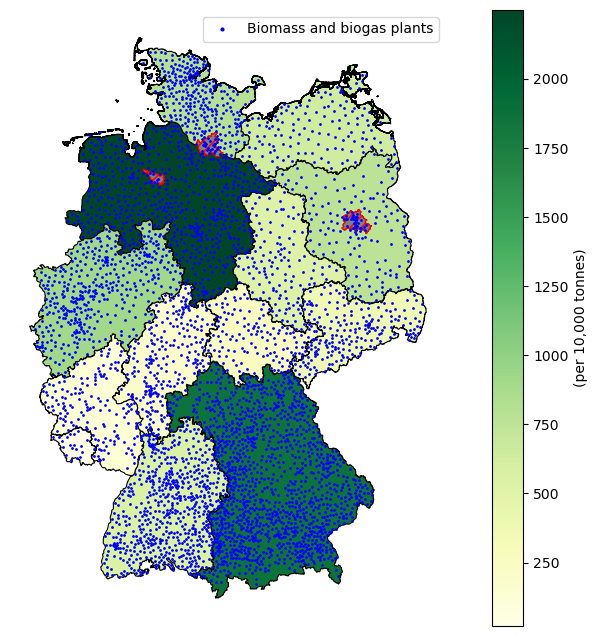

In [28]:

fig, ax = plt.subplots(1, 1, figsize=(12, 8))
germany_merged.plot(
    column="Silage_maize(per 10,000 tons)",
    cmap="YlGn",
    linewidth=0.8,
    edgecolor="black",
    legend=True,
    legend_kwds={'label': "(per 10,000 tonnes)"},
    missing_kwds={
        "color": "grey",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Data not available"},

    ax=ax)



for _, row in biogas_plant_location.iterrows():
     ax.scatter(row["longitude"], row["latitude"], color='blue', s=1, label="Biogasa and biomass plant locations")




ax.axis("off")

ax.legend(handles=[location], loc="upper right", fontsize=10)
"""plt.savefig(r"C:\Faounhofer Master thesis\Image Collection\State-wise_maize_production_for_year_2024_with_the_location_of_the_biomass_and_biogas_plants.png", dpi=1200, format='png',
         bbox_inches='tight', pad_inches=0.1,
        
           )"""

plt.show()

In [29]:
Hydrogen_potential = maize.rename(columns={"Silage_maize(per 10,000 tons)":"Silage_maize(per_tons)"})
Hydrogen_potential

,Federal_states,Silage_maize(per_tons)
0,Baden-Wuerttemberg,568.0640
1,Bayern,1861.2972
2,Brandenburg,769.1054
3,Hessen,196.1596
4,Mecklenburg-Vorpommern,632.4150
5,Niedersachsen,2249.6222
6,Nordrhein-Westfalen,909.7900
7,Rheinland-Pfalz,133.5838
8,Saarland,20.4148
9,Sachsen,370.5730


In [ ]:
Hydrogen_potential["Silage_maize(per_tons)"]= Hydrogen_potential["Silage_maize(per_tons)"]*(10000)
Hydrogen_potential

,Federal_states,Silage_maize(per_tons)
0,Baden-Wuerttemberg,5680640.0
1,Bayern,18612972.0
2,Brandenburg,7691054.0
3,Hessen,1961596.0
4,Mecklenburg-Vorpommern,6324150.0
5,Niedersachsen,22496222.0
6,Nordrhein-Westfalen,9097900.0
7,Rheinland-Pfalz,1335838.0
8,Saarland,204148.0
9,Sachsen,3705730.0


In [ ]:
Hydrogen_potential_01 = Hydrogen_potential.rename(columns={"Silage_maize(per_tons)":"Silage_maize(tonnes)"})
Hydrogen_potential_01

In [ ]:
Hydrogen_potential_01["Silage_maize(tonnes)"] = Hydrogen_potential_01["Silage_maize(tonnes)"]*0.35
Hydrogen_potential_01

In [ ]:
Hydrogen_potential_01["Silage_maize(tonnes)"] = Hydrogen_potential_01["Silage_maize(tonnes)"]*0.35
Hydrogen_potential_01

In [ ]:
Hydrogen_potential_01["Silage_maize(tonnes)"] = Hydrogen_potential_01["Silage_maize(tonnes)"]/1126.125
Hydrogen_potential_01


In [ ]:
Hydrogen_potential_02 = Hydrogen_potential_01.rename(columns={"Silage_maize(tonnes)":"Hydrogen(tonnes)"})
Hydrogen_potential_02

In [ ]:
def precise_round(x, decimals=2):
    if pd.isna(x):  
        return np.nan  
    factor = 10 ** decimals
    return int(x * factor + 0.5) / factor 

Hydrogen_potential_02["Hydrogen(tonnes)"] = Hydrogen_potential_02["Hydrogen(tonnes)"].apply(lambda x: precise_round(x, 2))
Hydrogen_potential_02

In [ ]:
def precise_round(x, decimals=2):
    if pd.isna(x):  
        return np.nan  
    factor = 10 ** decimals
    return int(x * factor + 0.5) / factor 

Hydrogen_potential_02["Hydrogen(tonnes)"] = Hydrogen_potential_02["Hydrogen(tonnes)"].apply(lambda x: precise_round(x, 2))
Hydrogen_potential_02

In [ ]:
Hydrogen_potential_02["Hydrogen(tonnes)"].sum()

In [ ]:
germany_merged = germany_state.merge(
    Hydrogen_potential_02, 
    left_on="name",  
    right_on="Federal_states",
    how='left'
)

fig, ax = plt.subplots(1, 1, figsize=(12, 8), dpi=100)
germany_merged.plot(
    column="Hydrogen(tonnes)",
    cmap="YlGnBu",
    linewidth=0.8,
    edgecolor="black",
    legend=True,
    legend_kwds={'label': "Hydrogen(tonnes)"},
    missing_kwds={
        "color": "grey",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Data not available"},
    ax=ax
)

missing_patch = Patch(
    facecolor="grey",
    edgecolor="red",
    hatch="///",
    label="Data not available"
)

for x, row in germany_merged.iterrows():
    if not pd.isna(row["Hydrogen(tonnes)"]):
        x, y = row['geometry'].centroid.coords[0]

        if row['name'] == "Brandenburg":
            y -= 0.3  
        elif row['name'] == "Rheinland-Pfalz":
            y -= 0.1
        
        elif row['name'] in ["Niedersachsen", "Bayern"]:
            ax.text(x, y, f"{row['Hydrogen(tonnes)']:}", ha='center', va='center', fontsize=8, color='white')
            continue 
       
      
       
        ax.text(x, y, f"{row['Hydrogen(tonnes)']:}", ha='center', va='center', fontsize=8, color='black')


ax.legend(handles=[missing_patch], loc="upper right", fontsize=10)
#ax.set_title("Silage Maize/Green Maize Harvest in Germany for year 2024", fontsize=14)
ax.axis("off")
plt.savefig(r"C:\Faounhofer Master thesis\Image Collection\State-wise_hydrogen_potential_for_year_2024.png", dpi=1200, format='png',
          bbox_inches='tight', pad_inches=0.1,
        
         )

plt.show()

In [ ]:
H_01 = Hydrogen_potential_02.sort_values(by="Hydrogen(tonnes)", ascending=False)
H_01   = H_01 .reset_index(drop=True)
print(H_01 )
H_01 = list(H_01 ["Federal_states"])
print(H_01 )

In [ ]:
Only_biomass["federal_state"].unique()

In [ ]:
locations = Only_biomass[["latitude","longitude","federal_state"]]
locations

In [ ]:
bayern_row = germany_state[germany_state["name"] == "Bayern"]

if bayern_row.empty:
    raise ValueError("Bavaria boundary not found in the GeoJSON file")

bayern_geometry = bayern_row.geometry.iloc[0]

def is_within_bavaria(lat, lon):
    point = Point(lon, lat)
    return bayern_geometry.contains(point)

locations["is_in_bavaria"] = locations.apply(
    lambda row: is_within_bavaria(row["latitude"], row["longitude"]), axis=1
)

bayern_locations = locations[locations["is_in_bavaria"]]
bayern_locations

In [ ]:
Bayern = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
bayern_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Bayern),
    axis=1
)
Bayern

In [ ]:
baden_wuerttemberg_row = germany_state[germany_state["name"] == "Baden-Wuerttemberg"]

if baden_wuerttemberg_row.empty:
    raise ValueError("Baden-Württemberg boundary not found in the GeoJSON file")

baden_wuerttemberg_geometry = baden_wuerttemberg_row.geometry.iloc[0]

def is_within_baden_wuerttemberg(lat, lon):
    point = Point(lon, lat)
    return baden_wuerttemberg_geometry.contains(point)

locations["is_in_baden_wuerttemberg"] = locations.apply(
    lambda row: is_within_baden_wuerttemberg(row["latitude"], row["longitude"]), axis=1
)

baden_wuerttemberg_locations = locations[locations["is_in_baden_wuerttemberg"]]
baden_wuerttemberg_locations

In [ ]:
Baden_Württemberg = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
baden_wuerttemberg_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Baden_Württemberg),
    axis=1
)
Baden_Württemberg

In [ ]:
brandenburg_row = germany_state[germany_state["name"] == "Brandenburg"]

if brandenburg_row.empty:
    raise ValueError("Brandenburg boundary not found in the GeoJSON file")

brandenburg_geometry = brandenburg_row.geometry.iloc[0]

def is_within_brandenburg(lat, lon):
    point = Point(lon, lat)
    return brandenburg_geometry.contains(point)

locations["is_in_brandenburg"] = locations.apply(
    lambda row: is_within_brandenburg(row["latitude"], row["longitude"]), axis=1
)

brandenburg_locations = locations[locations["is_in_brandenburg"]]
brandenburg_locations

In [ ]:
Brandenburg	 = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
brandenburg_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Brandenburg),
    axis=1
)
Brandenburg	

In [ ]:
nordrhein_westfalen_row = germany_state[germany_state["name"] == "Nordrhein-Westfalen"]

if nordrhein_westfalen_row.empty:
    raise ValueError("Nordrhein-Westfalen boundary not found in the GeoJSON file")

nordrhein_westfalen_geometry = nordrhein_westfalen_row.geometry.iloc[0]

def is_within_nordrhein_westfalen(lat, lon):
    point = Point(lon, lat)
    return nordrhein_westfalen_geometry.contains(point)

locations["is_in_nordrhein_westfalen"] = locations.apply(
    lambda row: is_within_nordrhein_westfalen(row["latitude"], row["longitude"]), axis=1
)

nordrhein_westfalen_locations = locations[locations["is_in_nordrhein_westfalen"]]
nordrhein_westfalen_locations 

In [ ]:
Nordrhein_Westfalen = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
nordrhein_westfalen_locations .apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Nordrhein_Westfalen),
    axis=1
)
Nordrhein_Westfalen

In [ ]:
saarland_row = germany_state[germany_state["name"] == "Saarland"]

if saarland_row.empty:
    raise ValueError("Saarland boundary not found in the GeoJSON file")

saarland_geometry = saarland_row.geometry.iloc[0]

def is_within_saarland(lat, lon):
    point = Point(lon, lat)
    return saarland_geometry.contains(point)

locations["is_in_saarland"] = locations.apply(
    lambda row: is_within_saarland(row["latitude"], row["longitude"]), axis=1
)

saarland_locations = locations[locations["is_in_saarland"]]
saarland_locations

In [ ]:
saarland_locations.info()

In [ ]:
Saarland = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
saarland_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Saarland),
    axis=1
)
Saarland

In [ ]:
hamburg_row = germany_state[germany_state["name"] == "Hamburg"]

if hamburg_row.empty:
    raise ValueError("Hamburg boundary not found in the GeoJSON file")

hamburg_geometry = hamburg_row.geometry.iloc[0]

def is_within_hamburg(lat, lon):
    point = Point(lon, lat)
    return hamburg_geometry.contains(point)

locations["is_in_hamburg"] = locations.apply(
    lambda row: is_within_hamburg(row["latitude"], row["longitude"]), axis=1
)

hamburg_locations = locations[locations["is_in_hamburg"]]
hamburg_locations

In [ ]:
hamburg_locations.info()

In [ ]:
Hamburg = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
hamburg_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Hamburg),
    axis=1
)
Hamburg

In [ ]:
sachsen_row = germany_state[germany_state["name"] == "Sachsen"]

if sachsen_row.empty:
    raise ValueError("Sachsen boundary not found in the GeoJSON file")

sachsen_geometry = sachsen_row.geometry.iloc[0]

def is_within_sachsen(lat, lon):
    point = Point(lon, lat)
    return sachsen_geometry.contains(point)

locations["is_in_sachsen"] = locations.apply(
    lambda row: is_within_sachsen(row["latitude"], row["longitude"]), axis=1
)

sachsen_locations = locations[locations["is_in_sachsen"]]
sachsen_locations

In [ ]:
Sachsen = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
sachsen_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Sachsen),
    axis=1
)
Sachsen

In [ ]:
thueringen_row = germany_state[germany_state["name"] == "Thueringen"]

if thueringen_row.empty:
    raise ValueError("Thüringen boundary not found in the GeoJSON file")

thueringen_geometry = thueringen_row.geometry.iloc[0]

def is_within_thueringen(lat, lon):
    point = Point(lon, lat)
    return thueringen_geometry.contains(point)

locations["is_in_thueringen"] = locations.apply(
    lambda row: is_within_thueringen(row["latitude"], row["longitude"]), axis=1
)

thueringen_locations = locations[locations["is_in_thueringen"]]
thueringen_locations

In [ ]:
Thüringen = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
thueringen_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Thüringen),
    axis=1
)
Thüringen

In [ ]:
rheinland_pfalz_row = germany_state[germany_state["name"] == "Rheinland-Pfalz"]

if rheinland_pfalz_row.empty:
    raise ValueError("Rheinland-Pfalz boundary not found in the GeoJSON file")

rheinland_pfalz_geometry = rheinland_pfalz_row.geometry.iloc[0]

def is_within_rheinland_pfalz(lat, lon):
    point = Point(lon, lat)
    return rheinland_pfalz_geometry.contains(point)

locations["is_in_rheinland_pfalz"] = locations.apply(
    lambda row: is_within_rheinland_pfalz(row["latitude"], row["longitude"]), axis=1
)

rheinland_pfalz_locations = locations[locations["is_in_rheinland_pfalz"]]
rheinland_pfalz_locations

In [ ]:
Rheinland_Pfalz = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
rheinland_pfalz_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Rheinland_Pfalz),
    axis=1
)
Rheinland_Pfalz

In [ ]:
hessen_row = germany_state[germany_state["name"] == "Hessen"]

if hessen_row.empty:
    raise ValueError("Hessen boundary not found in the GeoJSON file")

hessen_geometry = hessen_row.geometry.iloc[0]

def is_within_hessen(lat, lon):
    point = Point(lon, lat)
    return hessen_geometry.contains(point)

locations["is_in_hessen"] = locations.apply(
    lambda row: is_within_hessen(row["latitude"], row["longitude"]), axis=1
)

hessen_locations = locations[locations["is_in_hessen"]]
hessen_locations 

In [ ]:
Hessen = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
hessen_locations .apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Hessen),
    axis=1
)
Hessen

In [ ]:
niedersachsen_row = germany_state[germany_state["name"] == "Niedersachsen"]

if niedersachsen_row.empty:
    raise ValueError("Niedersachsen boundary not found in the GeoJSON file")

niedersachsen_geometry = niedersachsen_row.geometry.iloc[0]

def is_within_niedersachsen(lat, lon):
    point = Point(lon, lat)
    return niedersachsen_geometry.contains(point)

locations["is_in_niedersachsen"] = locations.apply(
    lambda row: is_within_niedersachsen(row["latitude"], row["longitude"]), axis=1
)

niedersachsen_locations = locations[locations["is_in_niedersachsen"]]
niedersachsen_locations

In [ ]:
Niedersachsen = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
niedersachsen_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Niedersachsen),
    axis=1
)
Niedersachsen

In [ ]:
mecklenburg_vorpommern_row = germany_state[germany_state["name"] == "Mecklenburg-Vorpommern"]

if mecklenburg_vorpommern_row.empty:
    raise ValueError("Mecklenburg-Vorpommern boundary not found in the GeoJSON file")

mecklenburg_vorpommern_geometry = mecklenburg_vorpommern_row.geometry.iloc[0]

def is_within_mecklenburg_vorpommern(lat, lon):
    point = Point(lon, lat)
    return mecklenburg_vorpommern_geometry.contains(point)

locations["is_in_mecklenburg_vorpommern"] = locations.apply(
    lambda row: is_within_mecklenburg_vorpommern(row["latitude"], row["longitude"]), axis=1
)

mecklenburg_vorpommern_locations = locations[locations["is_in_mecklenburg_vorpommern"]]
mecklenburg_vorpommern_locations

In [ ]:
Mecklenburg_Vorpommern = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
mecklenburg_vorpommern_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Mecklenburg_Vorpommern),
    axis=1
)
Mecklenburg_Vorpommern

In [ ]:
sachsen_anhalt_row = germany_state[germany_state["name"] == "Sachsen-Anhalt"]

if sachsen_anhalt_row.empty:
    raise ValueError("Sachsen-Anhalt boundary not found in the GeoJSON file")

sachsen_anhalt_geometry = sachsen_anhalt_row.geometry.iloc[0]

def is_within_sachsen_anhalt(lat, lon):
    point = Point(lon, lat)
    return sachsen_anhalt_geometry.contains(point)

locations["is_in_sachsen_anhalt"] = locations.apply(
    lambda row: is_within_sachsen_anhalt(row["latitude"], row["longitude"]), axis=1
)

sachsen_anhalt_locations = locations[locations["is_in_sachsen_anhalt"]]
sachsen_anhalt_locations

In [ ]:
Sachsen_Anhalt = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
sachsen_anhalt_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Sachsen_Anhalt),
    axis=1
)
Sachsen_Anhalt

In [ ]:
schleswig_holstein_row = germany_state[germany_state["name"] == "Schleswig-Holstein"]

if schleswig_holstein_row.empty:
    raise ValueError("Schleswig-Holstein boundary not found in the GeoJSON file")

schleswig_holstein_geometry = schleswig_holstein_row.geometry.iloc[0]

def is_within_schleswig_holstein(lat, lon):
    point = Point(lon, lat)
    return schleswig_holstein_geometry.contains(point)

locations["is_in_schleswig_holstein"] = locations.apply(
    lambda row: is_within_schleswig_holstein(row["latitude"], row["longitude"]), axis=1
)

schleswig_holstein_locations = locations[locations["is_in_schleswig_holstein"]]
schleswig_holstein_locations 

In [ ]:
Schleswig_Holstein = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
schleswig_holstein_locations .apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Schleswig_Holstein),
    axis=1
)
Schleswig_Holstein

In [ ]:
bremen_row = germany_state[germany_state["name"] == "Bremen"]

if bremen_row.empty:
    raise ValueError("Bremen boundary not found in the GeoJSON file")

bremen_geometry = bremen_row.geometry.iloc[0]

def is_within_bremen(lat, lon):
    point = Point(lon, lat)
    return bremen_geometry.contains(point)

locations["is_in_bremen"] = locations.apply(
    lambda row: is_within_bremen(row["latitude"], row["longitude"]), axis=1
)

bremen_locations = locations[locations["is_in_bremen"]]
bremen_locations

In [ ]:
bremen_locations.info()

In [ ]:
Bremen = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
bremen_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Bremen),
    axis=1
)
Bremen

In [ ]:
berlin_row = germany_state[germany_state["name"] == "Berlin"]

if berlin_row.empty:
    raise ValueError("Berlin boundary not found in the GeoJSON file")

berlin_geometry = berlin_row.geometry.iloc[0]

def is_within_berlin(lat, lon):
    point = Point(lon, lat)
    return berlin_geometry.contains(point)

locations["is_in_berlin"] = locations.apply(
    lambda row: is_within_berlin(row["latitude"], row["longitude"]), axis=1
)

berlin_locations = locations[locations["is_in_berlin"]]
berlin_locations

In [ ]:
berlin_locations.info()

In [ ]:
Berlin = folium.Map(location= [51.5167,9.9167], zoom_start = 4)
berlin_locations.apply(
    lambda row: folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=1,  
        color='blue',  
        fill=True, 
        fill_color='blue',  
        fill_opacity=0.7  
    ).add_to(Berlin),
    axis=1
)
Berlin

In [ ]:
biogas_plants_by_state = pd.DataFrame({"Federal_states":["Baden-Wuerttemberg","Bayern","Brandenburg","Hessen","Mecklenburg-Vorpommern","Niedersachsen","Nordrhein-Westfalen","Rheinland-Pfalz","Saarland","Sachsen","Sachsen-Anhalt","Schleswig-Holstein","Thueringen","Berlin", "Hamburg","Bremen"],"Biomass and biogas plants(1900-2019)":[621,1287,135,234,136,527,398,156,20,203,125,276,132,36,25,6]})
biogas_plants_by_state


In [ ]:
germany_plants =  folium.Map(location=[51.5167,9.9167], zoom_start=4)
folium.Choropleth(
    geo_data=germany_state,
    data=biogas_plants_by_state,
    columns=["Federal_states", "Biomass and biogas plants(1900-2019)"],
    key_on="feature.properties.name",
    fill_color="RdYlBu",
    nan_fill_color = 'black',
    nan_fill_opacity=0.7,
    fill_opacity=0.7,
    line_opacity=1,
    legend_name="Biomass and biogas plants in States of germany (1900-2019)",
    highlight=True,
).add_to(germany_plants)

germany_plants

In [ ]:
germany_merged = germany_state.merge(
    biogas_plants_by_state, 
    left_on="name",  
    right_on="Federal_states",
    how='left'
)

fig, ax = plt.subplots(1, 1, figsize=(12, 8), dpi=100)
germany_merged.plot(
    column="Biomass and biogas plants(1900-2019)",
    cmap="viridis",
    linewidth=0.8,
    edgecolor="black",
    legend=True,
    legend_kwds={'label': "Number of biomass and biogas plants"},
    missing_kwds={
        "color": "grey",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Data not available"},
    ax=ax
)


for x, row in germany_merged.iterrows():
    if not pd.isna(row["Biomass and biogas plants(1900-2019)"]):
        x, y = row['geometry'].centroid.coords[0]

        if row['name'] == "Brandenburg":
            y -= 0.3  
        ax.text(x, y, f"{row['Biomass and biogas plants(1900-2019)']}", ha='center', va='center', fontsize=8, color='yellow')

        if row['name'] in ["Bayern"]:
          ax.text(x, y, f"{row['Biomass and biogas plants(1900-2019)']}", ha='center', va='center', fontsize=8, color='Black')

       # if row['name'] in ["Bremen"]:
         # ax.text(x, y, f"{row['Biomass and biogas plants(1900-2019)']:.1f}", ha='center', va='center', fontsize=8, color='white')


#ax.set_title("Biomass and biogas plants in Germany by Stae-wise (1900-2019)", fontsize=14)
ax.axis("off")
"""plt.savefig(r"C:\Faounhofer Master thesis\Image Collection\plansts.png", dpi=1200, format='png',
          bbox_inches='tight', pad_inches=0.1,
        
         )"""
plt.show()
